# Wine Type Classification Dataset

## Variables

#### Type
Description:

#### Quality
Description:

#### Fixed acidity
Description:

#### Volatile acidity
Description:

#### Citric acid
Description:

#### Residual sugar
Description:

#### Chlorides
Description:

#### Free sulfur dioxide
Description:

#### Total sulfur dioxide
Description:

#### Density
Description:

#### pH
Description:

#### Sulphates
Description:

#### Alcohol
Description:


## Import necessary libraries

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

## Load dataset

In [5]:
df = pd.read_csv('wine_quality_merged.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


## Initial information about the dataset

The dataset contains 6497 samples with 13 features that describes their chemical properties and quality.

In [6]:
df.shape

(6497, 13)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  type                  6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [8]:
df.describe(include='all')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,white
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4898
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,NaN
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,NaN
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,NaN
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,NaN
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,NaN
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,NaN


In [9]:
df['quality'].unique()

array([5, 6, 7, 4, 8, 3, 9])

In [10]:
df['type'].unique()

array(['red', 'white'], dtype=object)

In [11]:
df.nunique() #Count of unique values per column

fixed acidity           106
volatile acidity        187
citric acid              89
residual sugar          316
chlorides               214
free sulfur dioxide     135
total sulfur dioxide    276
density                 998
pH                      108
sulphates               111
alcohol                 111
quality                   7
type                      2
dtype: int64

In [12]:
df.isna().any() #Checking if there is NaN

fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides               False
free sulfur dioxide     False
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
quality                 False
type                    False
dtype: bool

## Wine Quality Distribution per Type

Majority of the data are for the middle qualities 5, 6, and 7, with white wine having the highest counts.

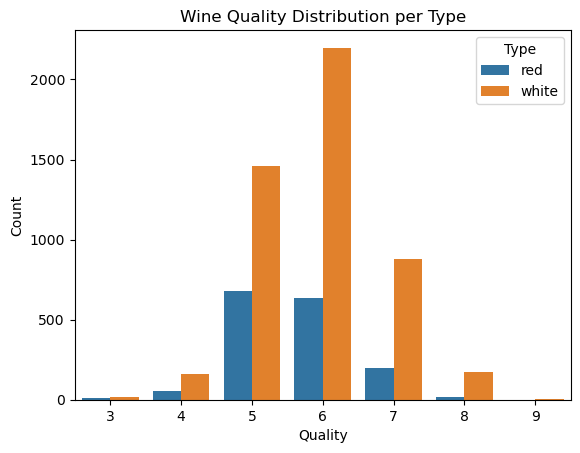

In [13]:
sns.countplot(data=df, x="quality", hue="type")
plt.title("Wine Quality Distribution per Type")
plt.xlabel("Quality")
plt.ylabel("Count")
plt.legend(title="Type")
plt.show()

# Relationship of features to quality

This section shows the relationship of different features to the wine quality. 

### Alcohol
From the quality of 6, the alcohol content increases. The median alcohol content of wines with quality of 7-8 are higher compared to the ones with lower quality (3-5).

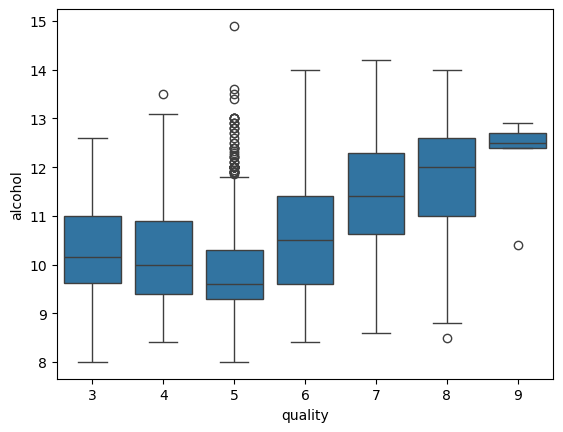

In [14]:
sns.boxplot(x="quality", y="alcohol", data=df)
plt.show()

### Fixed acidity
Wines in the middle quality (5, 6, 7) have more inconsistent fixed acidity compared to the low (3, 4) and high (8, 9) quality.

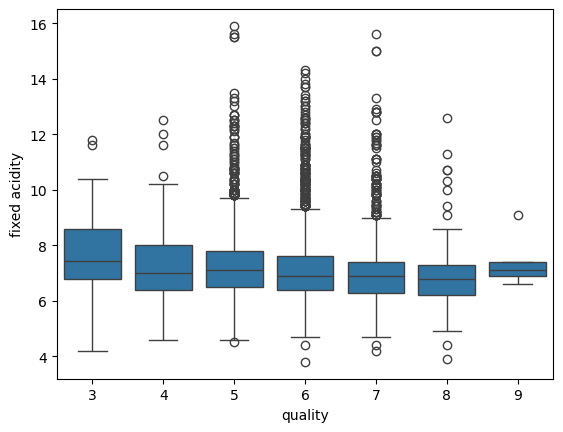

In [15]:
sns.boxplot(x="quality", y="fixed acidity", data=df)
plt.show()

### Volatile acidity
Similar to fixed acidity, wines in the middle quality (5, 6, 7) have more inconsistent volatile acidity compared to the low (3, 4) and high (8, 9) quality.

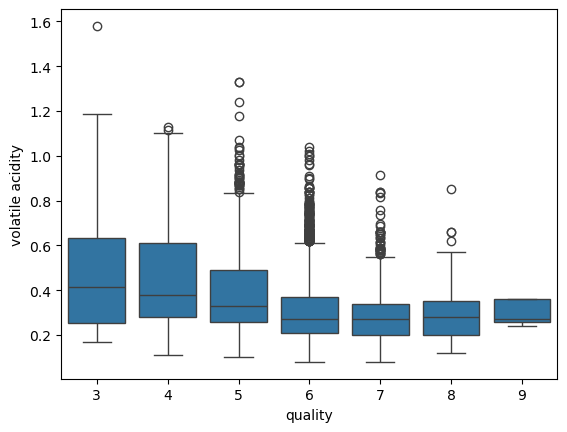

In [16]:
sns.boxplot(x="quality", y="volatile acidity", data=df)
plt.show()

### Citric acid


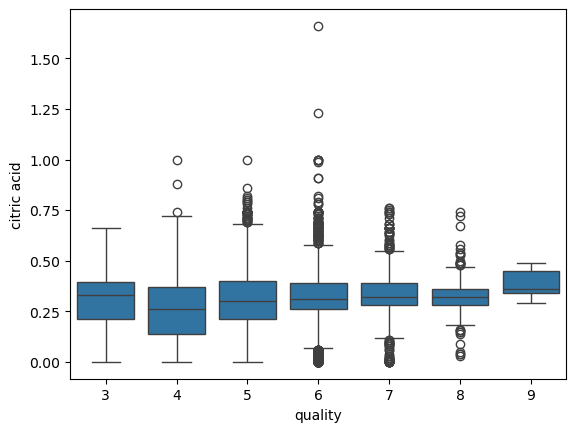

In [17]:
sns.boxplot(x="quality", y="citric acid", data=df)
plt.show()

### Residual sugar


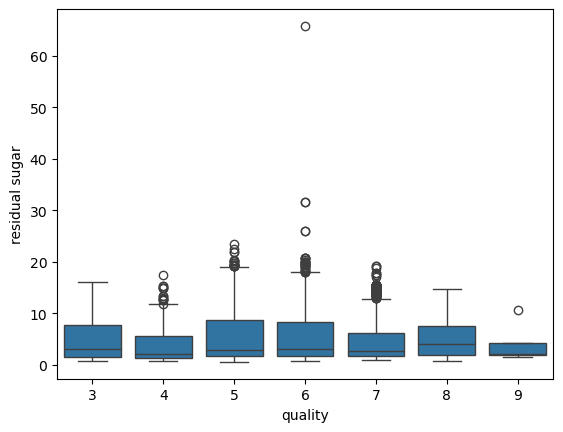

In [18]:
sns.boxplot(x="quality", y="residual sugar", data=df)
plt.show()

### Chlorides


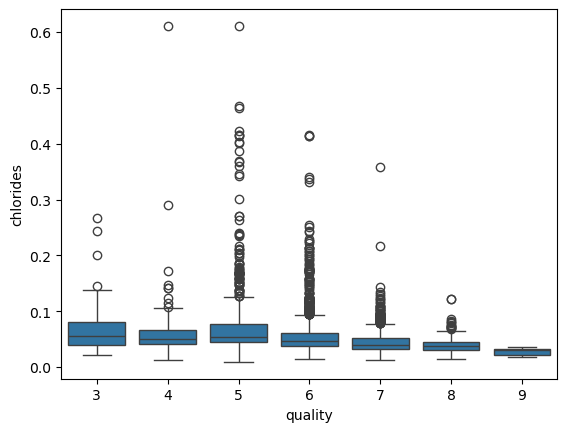

In [19]:
sns.boxplot(x="quality", y="chlorides", data=df)
plt.show()

### Free sulfur dioxide


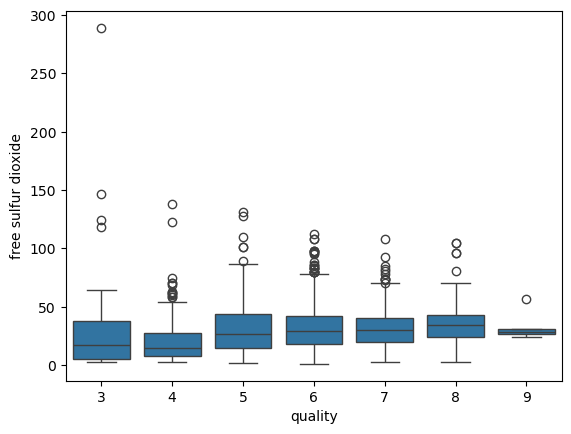

In [20]:
sns.boxplot(x="quality", y="free sulfur dioxide", data=df)
plt.show()

### Total sulfur dioxide

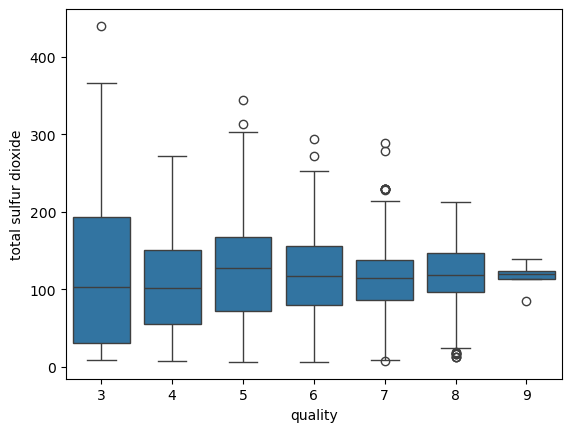

In [21]:
sns.boxplot(x="quality", y="total sulfur dioxide", data=df)
plt.show()

### Density

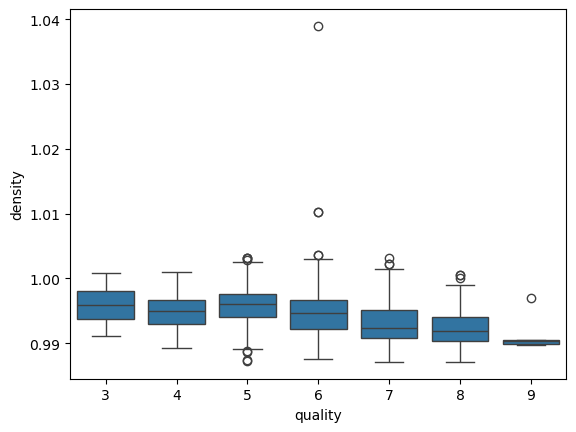

In [22]:
sns.boxplot(x="quality", y="density", data=df)
plt.show()

### pH

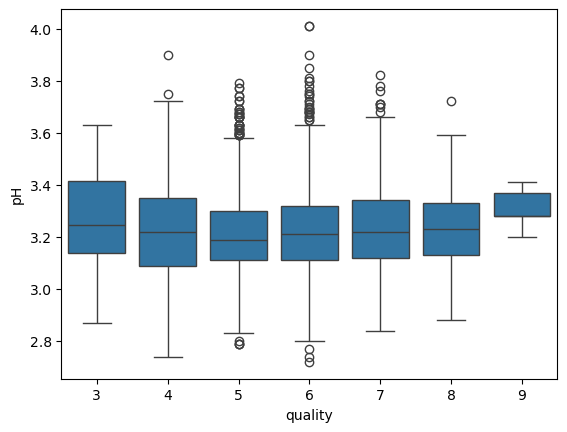

In [23]:
sns.boxplot(x="quality", y="pH", data=df)
plt.show()

### Sulphates

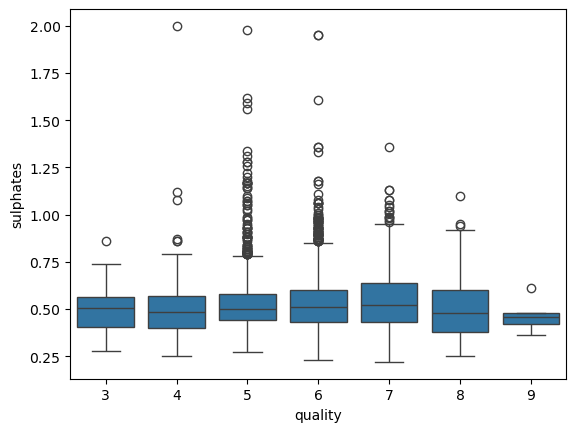

In [24]:
sns.boxplot(x="quality", y="sulphates", data=df)
plt.show()

# Distribution of Features per Type

### Fixed Acidity

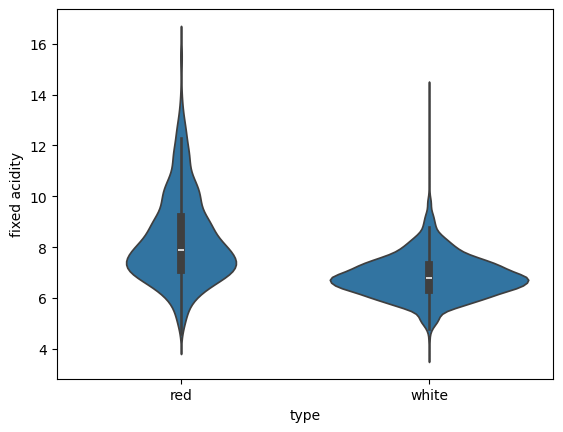

In [25]:
sns.violinplot(x="type", y="fixed acidity", data=df)
plt.show()

### Volatile acidity

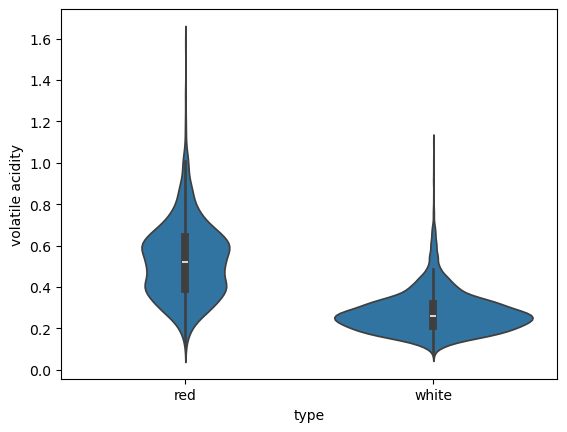

In [26]:
sns.violinplot(x="type", y="volatile acidity", data=df)
plt.show()

### Citric acid

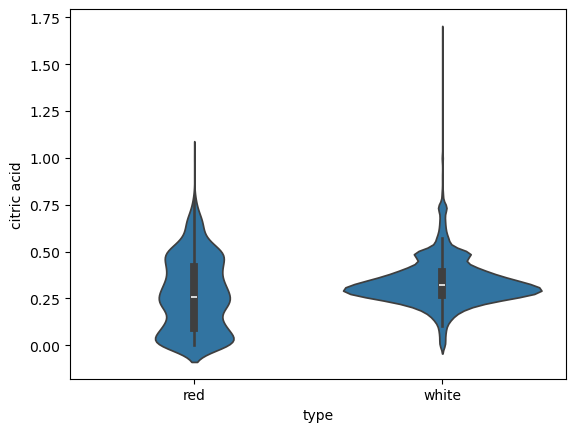

In [27]:
sns.violinplot(x="type", y="citric acid", data=df)
plt.show()

### Residual Sugar

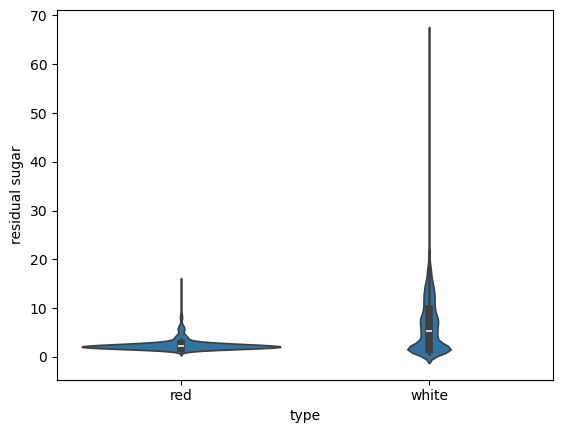

In [28]:
sns.violinplot(x="type", y="residual sugar", data=df)
plt.show()

### Chlorides

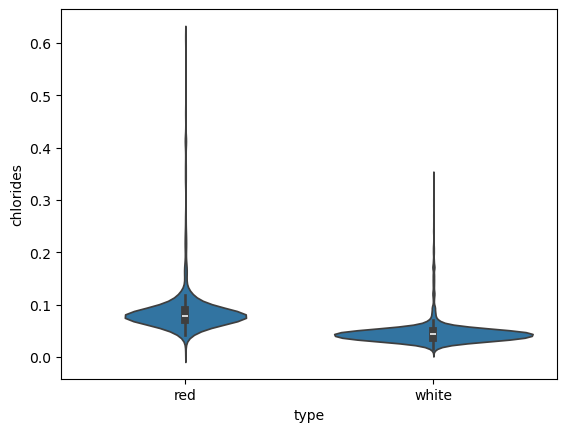

In [29]:
sns.violinplot(x="type", y="chlorides", data=df)
plt.show()

### Free sulfur dioxide

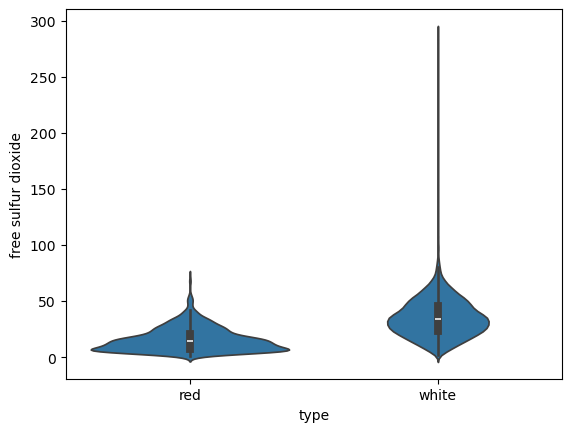

In [30]:
sns.violinplot(x="type", y="free sulfur dioxide", data=df)
plt.show()

### Total sulfur dioxide

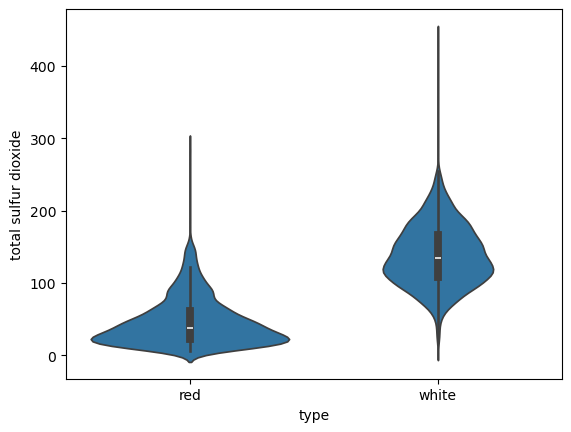

In [31]:
sns.violinplot(x="type", y="total sulfur dioxide", data=df)
plt.show()

### Density

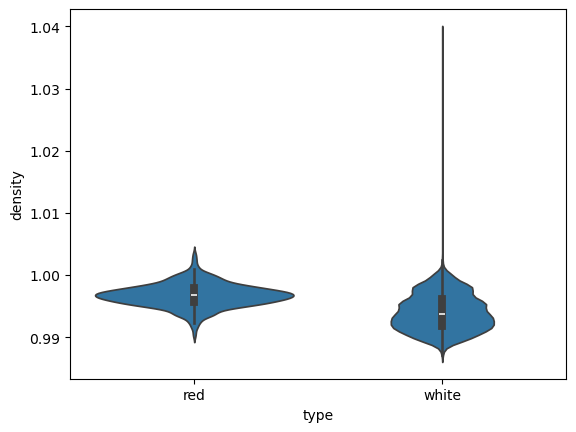

In [32]:
sns.violinplot(x="type", y="density", data=df)
plt.show()

### pH

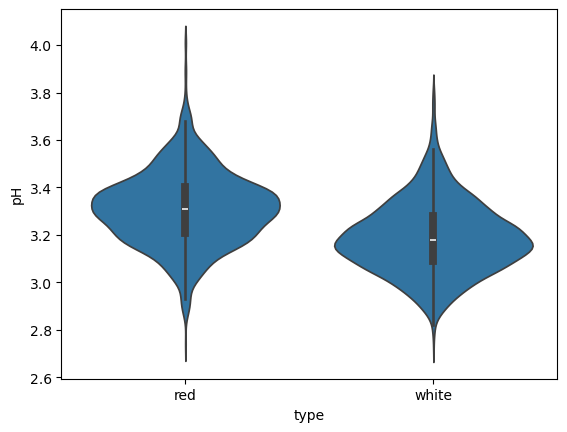

In [33]:
sns.violinplot(x="type", y="pH", data=df)
plt.show()

### Sulphates

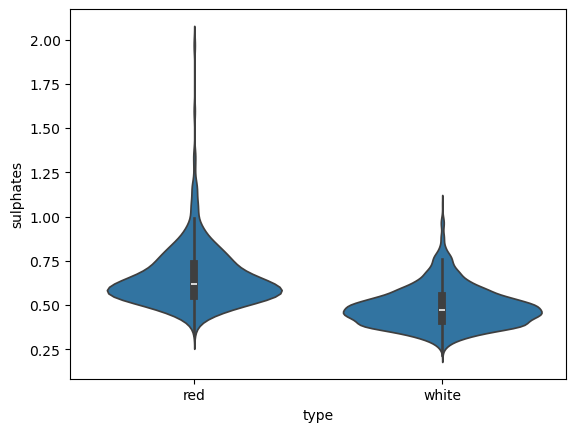

In [34]:
sns.violinplot(x="type", y="sulphates", data=df)
plt.show()

# Pairplots for possible segmentation

### By Type

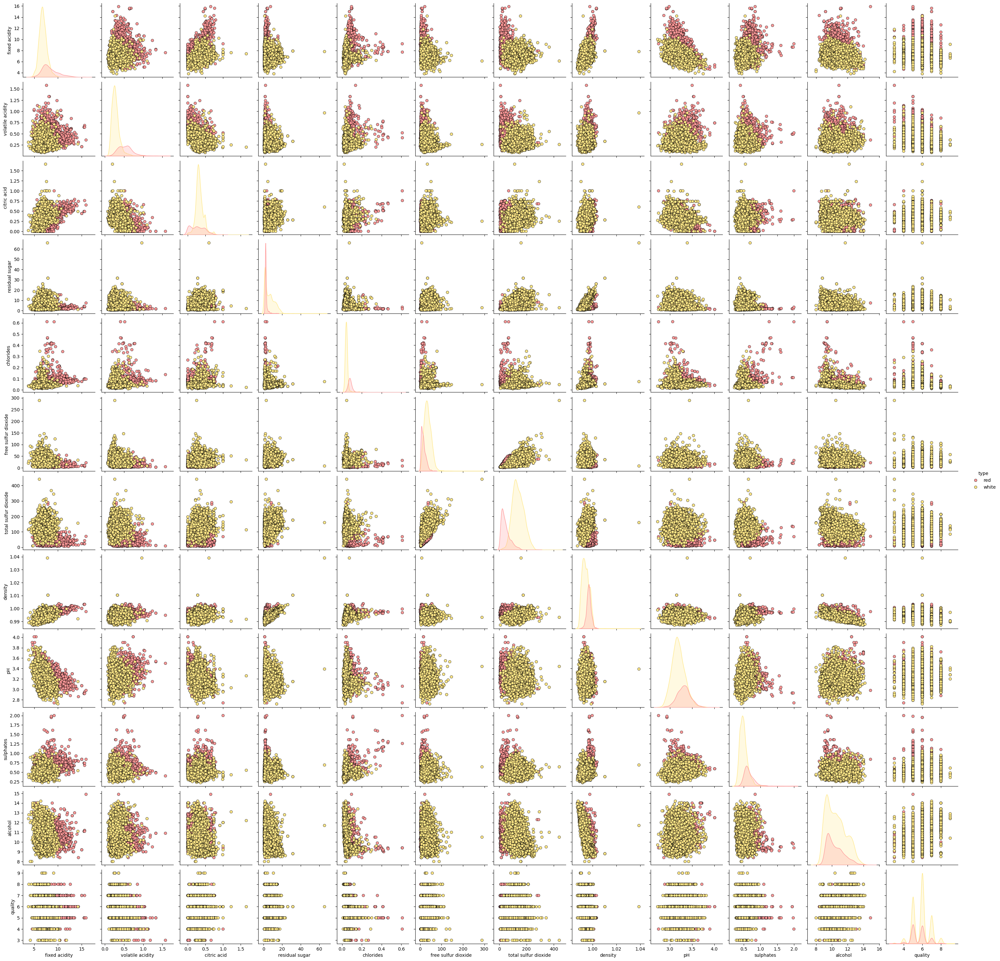

In [35]:
sns.pairplot(df, hue='type',palette={'red': '#FF9999', 'white': '#FFE888'}, plot_kws=dict(edgecolor='black', linewidth=0.5))

### By Quality

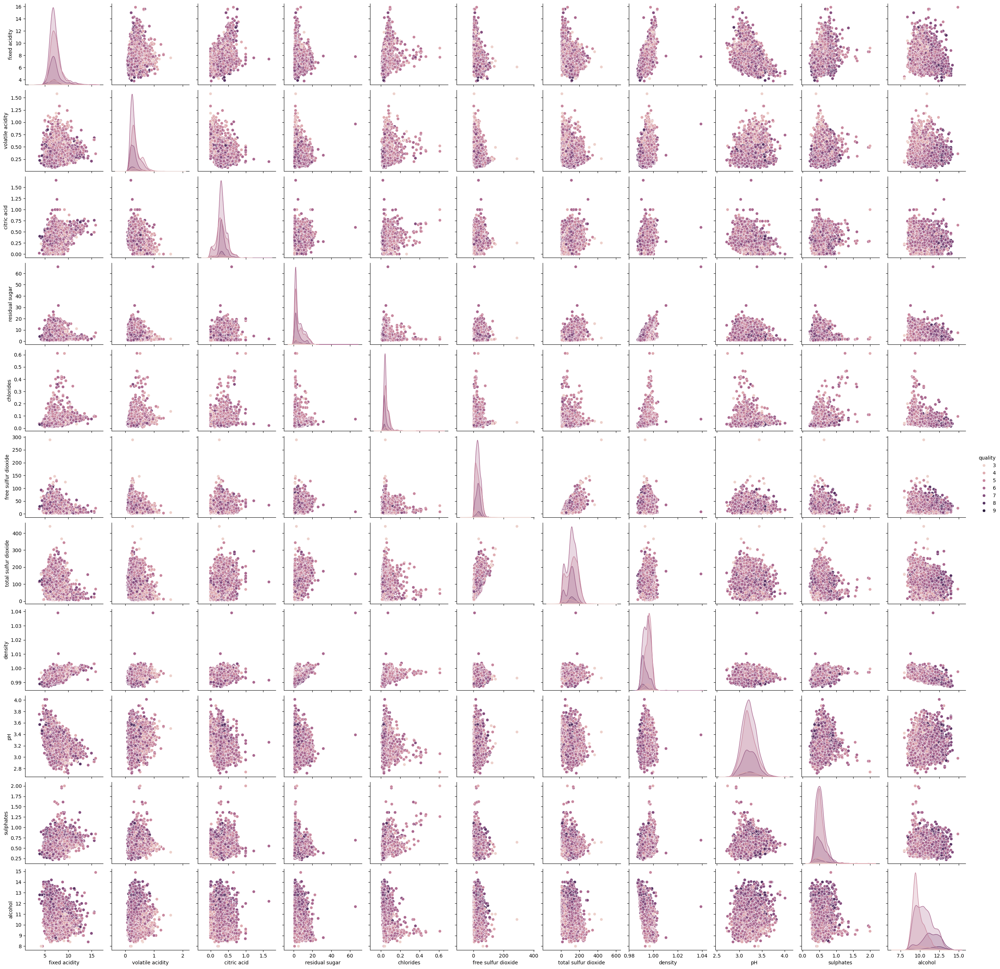

In [36]:
sns.pairplot(df, hue='quality')

# Plots for each Feature by Quality and Type

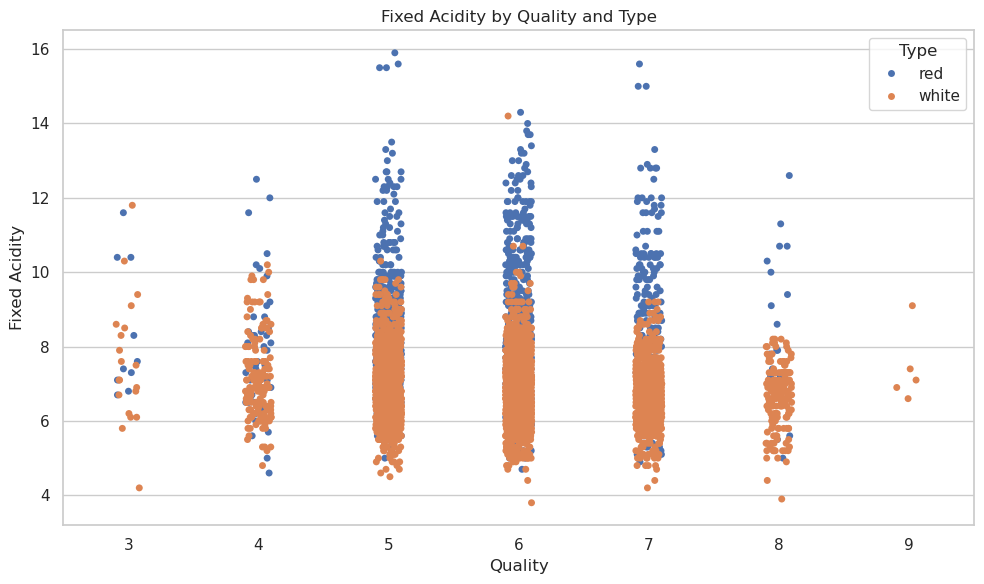

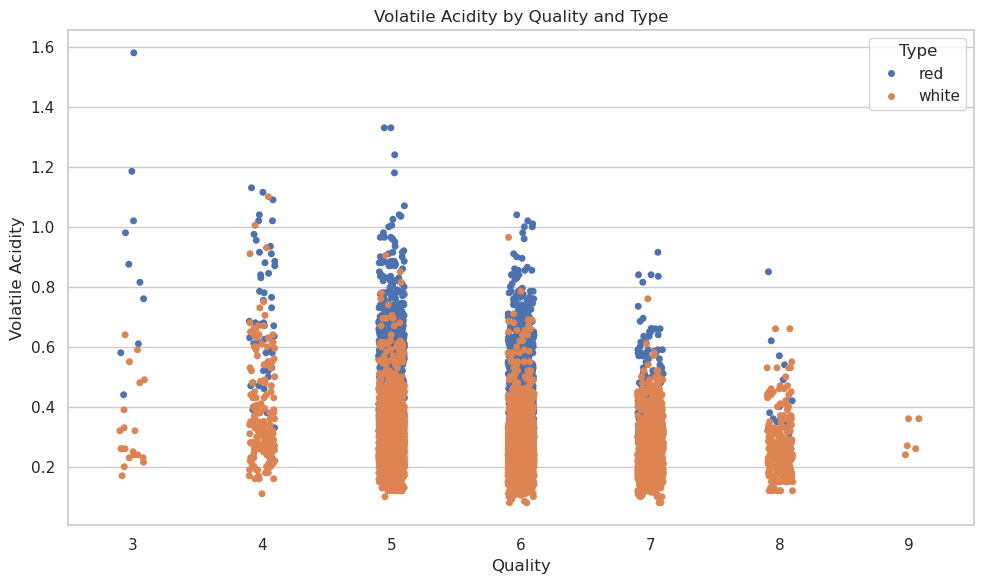

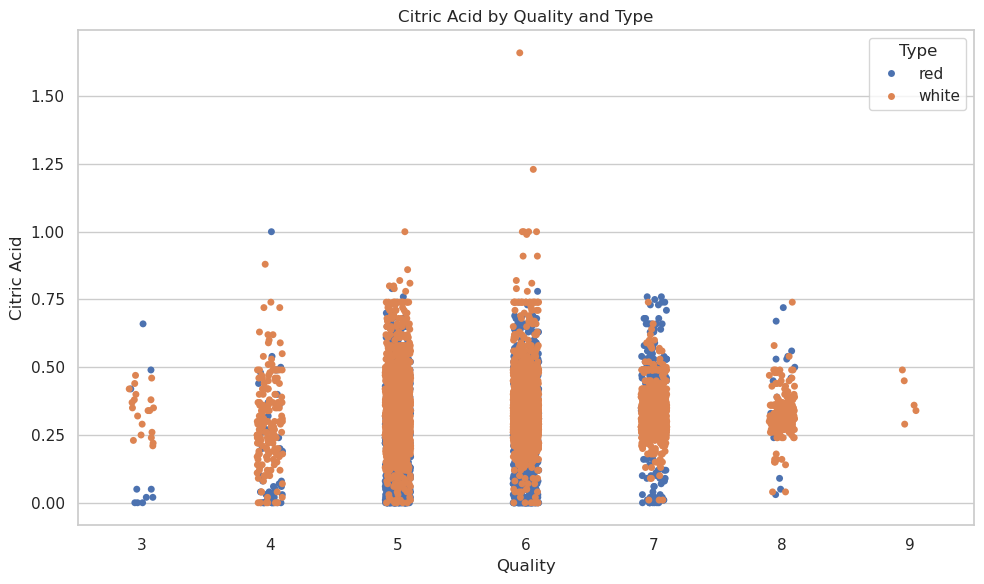

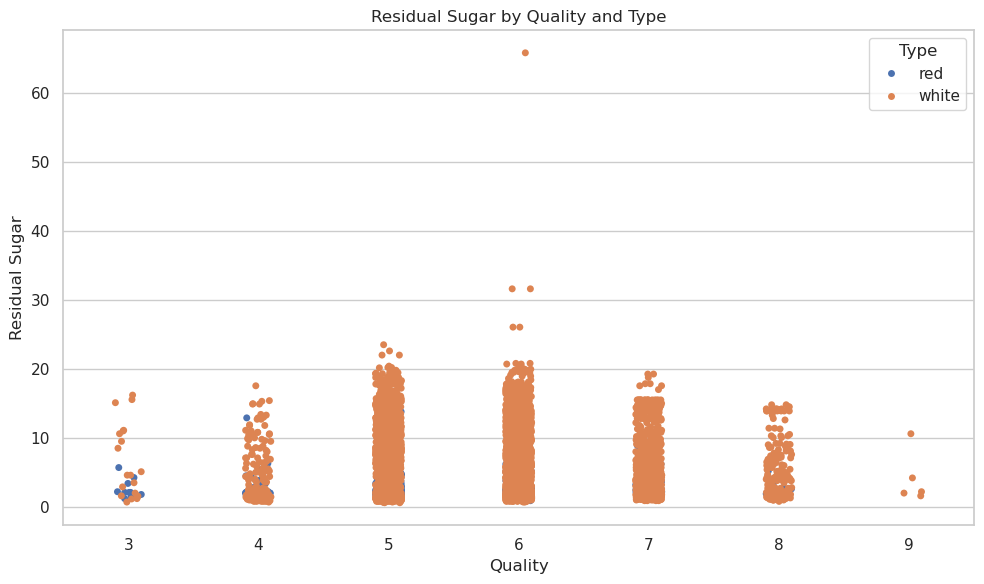

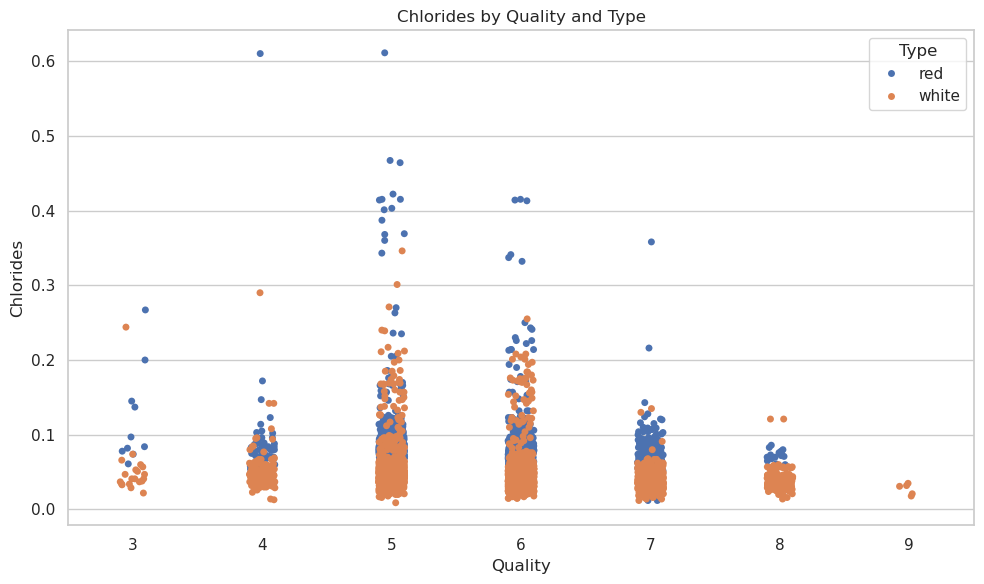

...

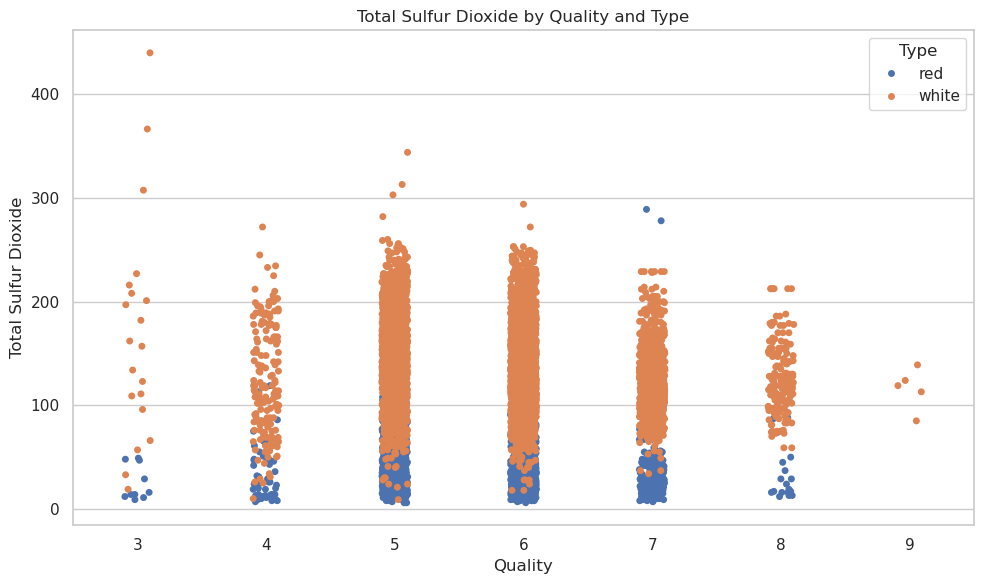

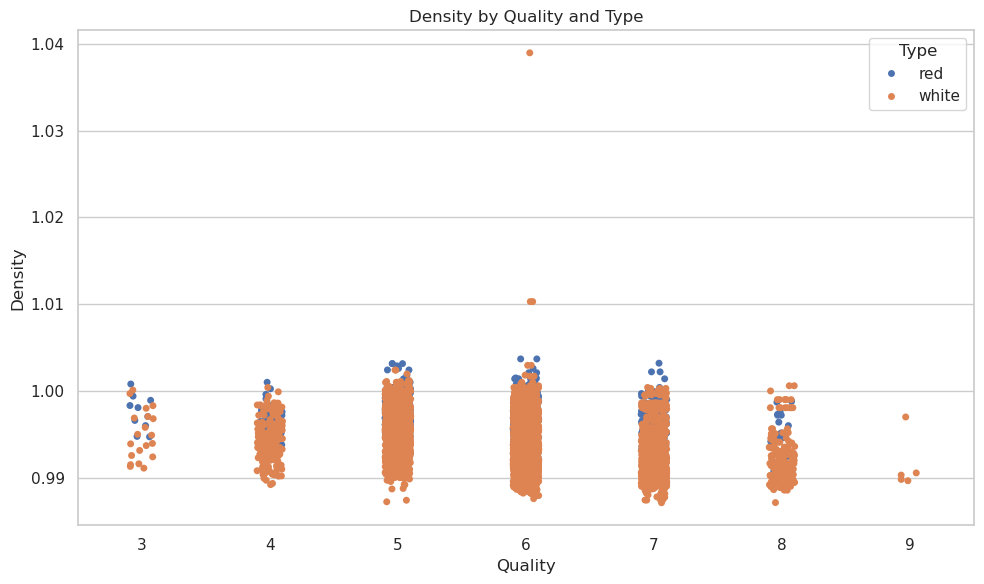

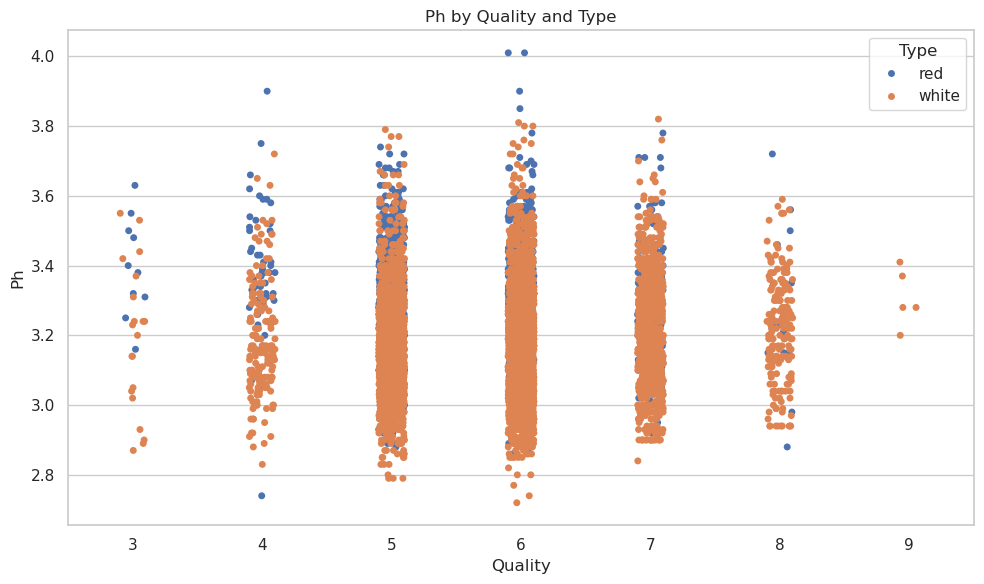

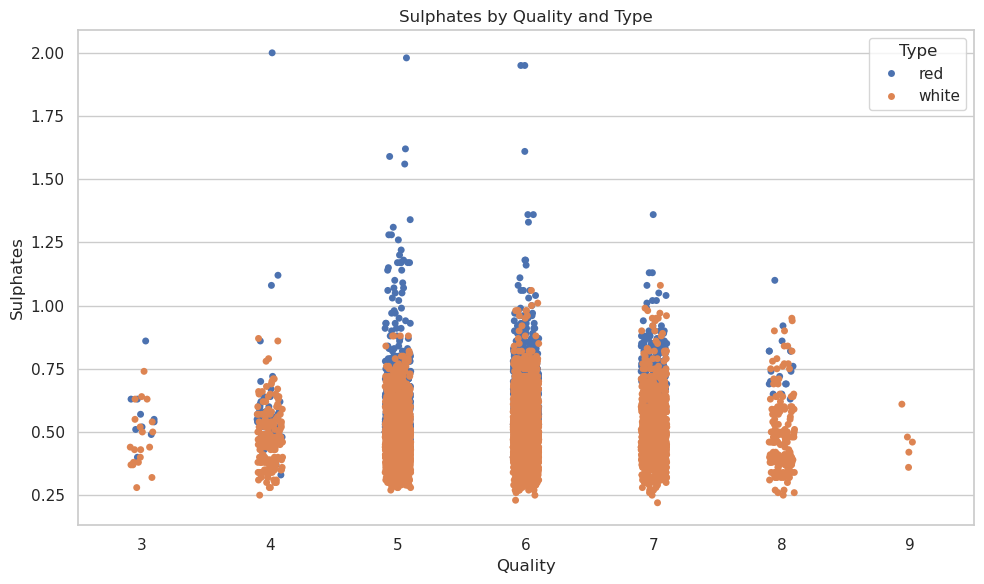

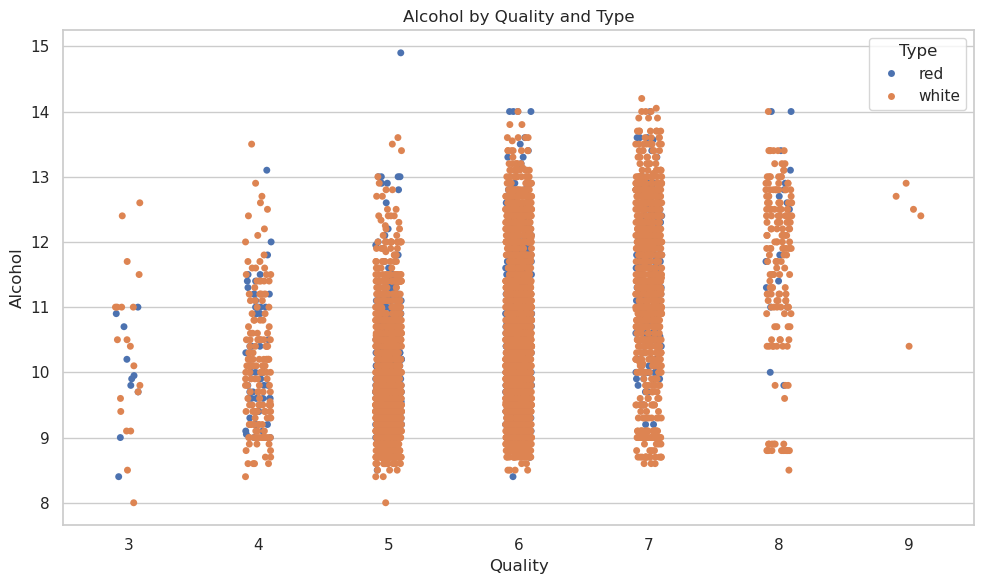

In [37]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']

sns.set(style="whitegrid")

for feature in features:
    plt.figure(figsize=(10, 6))
    sns.stripplot(data=df, x='quality', y=feature, hue='type')
    plt.title(f'{feature.replace("_", " ").title()} by Quality and Type')
    plt.xlabel('Quality')
    plt.ylabel(feature.replace("_", " ").title())
    plt.legend(title='Type')
    plt.tight_layout()
    plt.show()

In [38]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import mglearn

In [39]:
n_para = 3
clf = KNeighborsClassifier(n_neighbors=n_para)

In [40]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white
